### Sistem deteksi sampah menggunakan yolov5
### Bagus Wicaksono Nurjayanto/1301194280/IF-43-PIL-IS01

In [1]:
!pip install -Uq yolov5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.3/953.3 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 599.6/599.6 kB 51.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.0/104.0 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 27.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 85.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.3 MB/s eta

In [9]:
import numpy as np
import pandas as pd
import os
import yolov5
import random

import os
from google.colab import drive
drive.mount('/content/drive')
os.chdir("/content/drive/My Drive/Viskom")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
meta_file= '/content/drive/MyDrive/Viskom/metadata.csv'
IMAGE_PATH = '/content/drive/MyDrive/Viskom/Images/'

df = pd.read_csv(meta_file)
df['filepath'] = df['filename'].map(lambda x:  os.path.join(IMAGE_PATH,x))

labelmap = {}
for l in df.label.unique().tolist():
    if l == 1:
        labelmap[l] = 'dirty'
    else:
        labelmap[l] = 'clean'

df_dirty = df[df['label'] == 1]
df_dirty.reset_index(drop=True, inplace=True)

print(f"Found {df.groupby('label').count()['filename'][1]} images that are labelled = dirty and {df.groupby('label').count()['filename'][0]} that are labelled = clean")

Found 124 images that are labelled = dirty and 113 that are labelled = clean


In [11]:
model = yolov5.load('keremberke/yolov5m-garbage')

model.conf = 0.1
model.iou = 0.1
model.agnostic = True
model.multi_label = False
model.max_det = 5

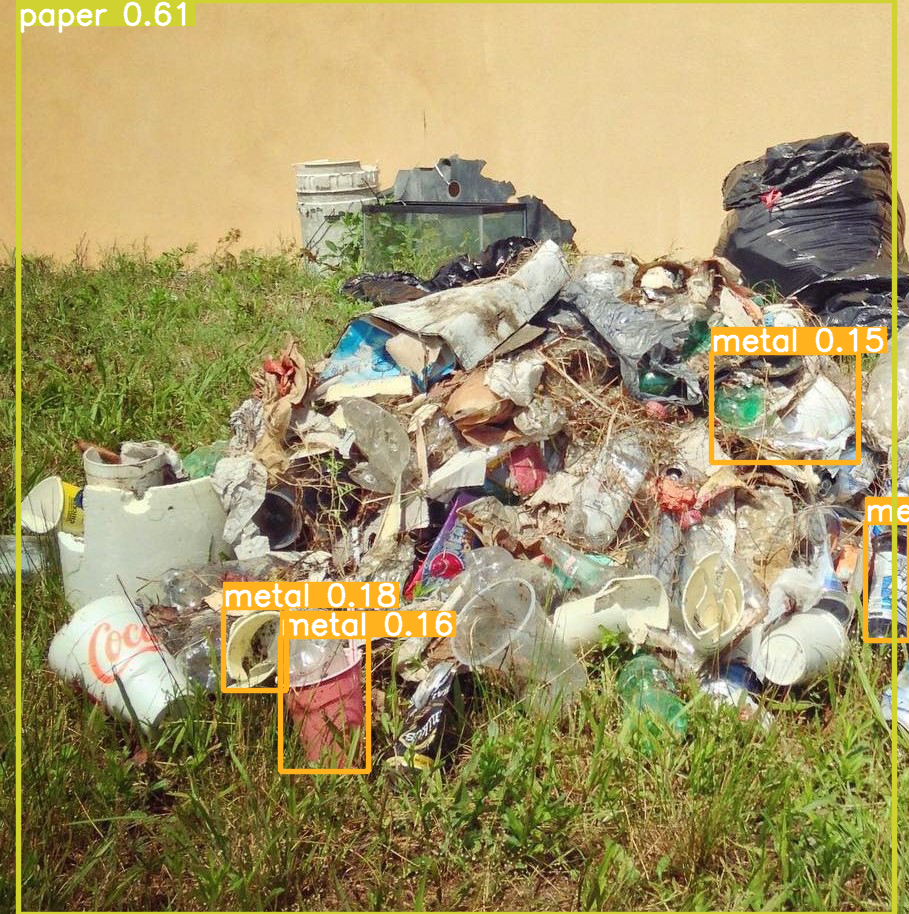

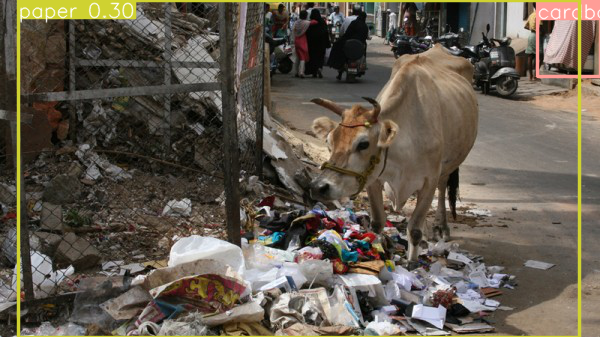

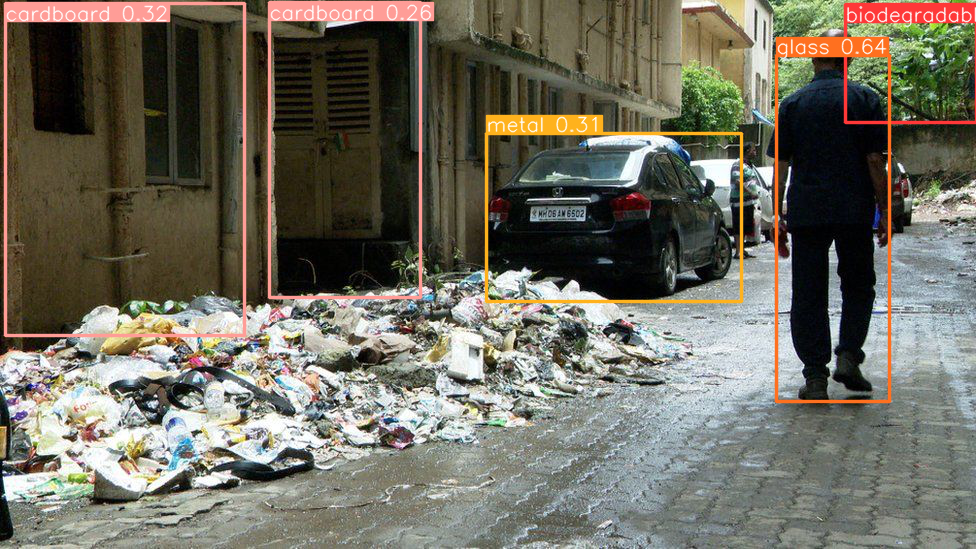

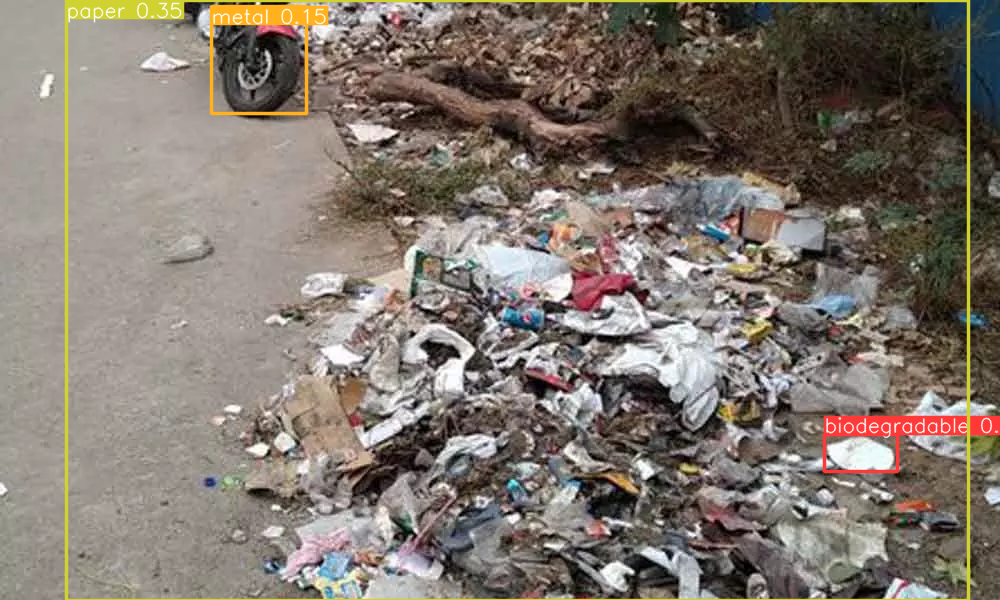

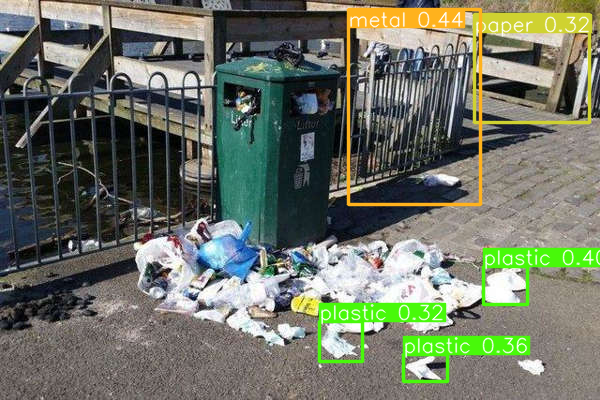

In [5]:
# Menampilkan 5 hasil gambar dirty
dirty_images = df_dirty['filepath'].sample(5)  # Memilih secara acak 5 gambar dirty
for image_path in dirty_images:
    results = model(image_path, size=640)
    predictions = results.pred[0]
    boxes = predictions[:, :4]
    scores = predictions[:, 4]
    categories = predictions[:, 5]
    results.show()

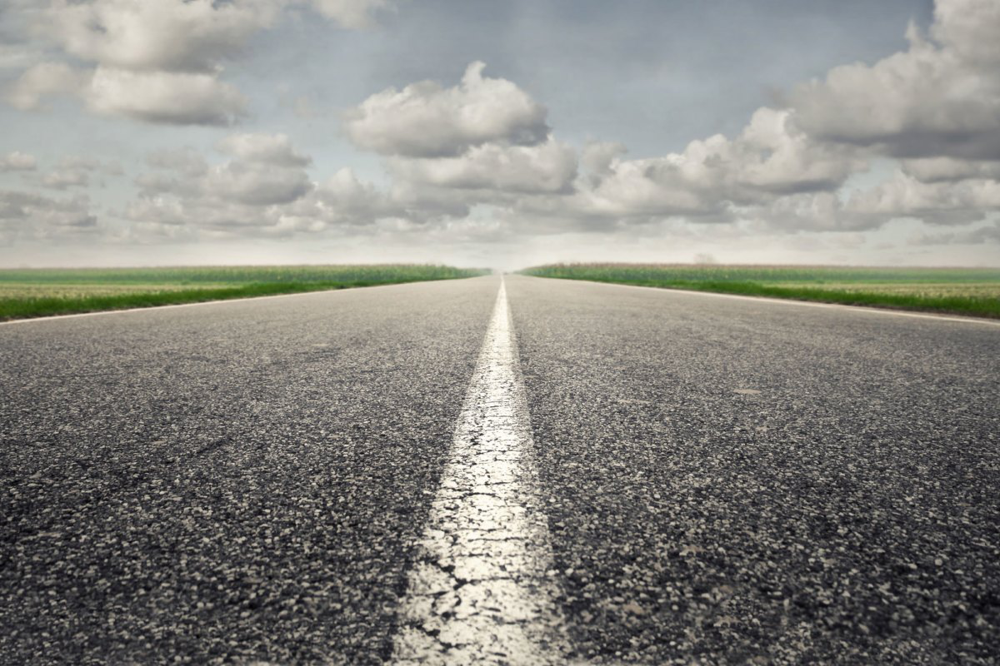

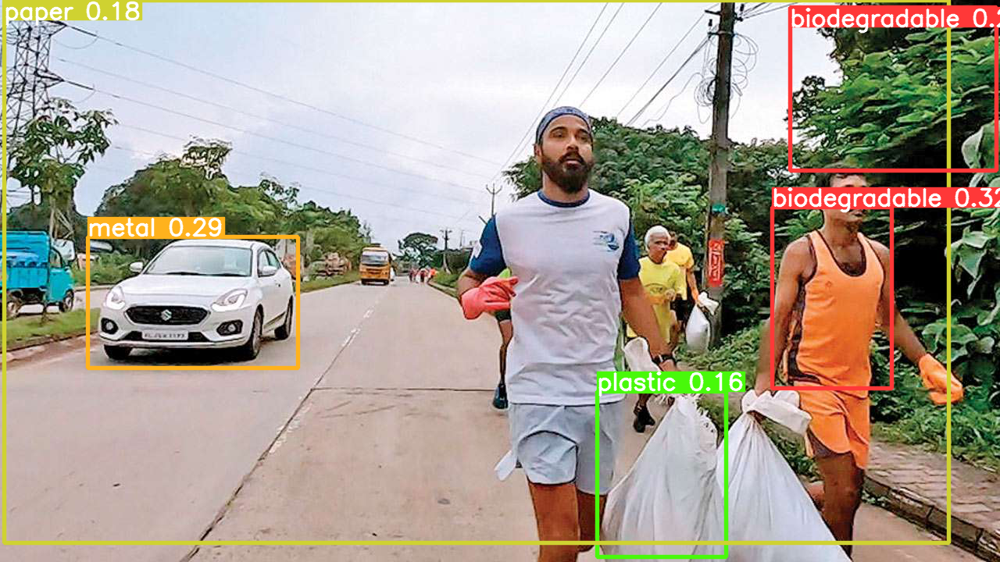

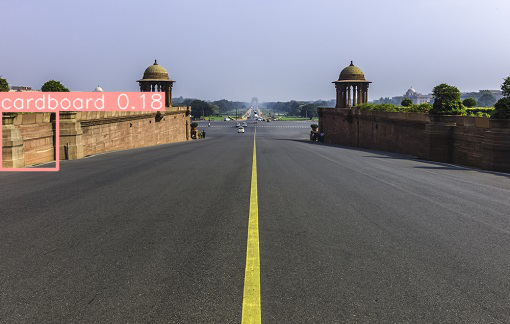

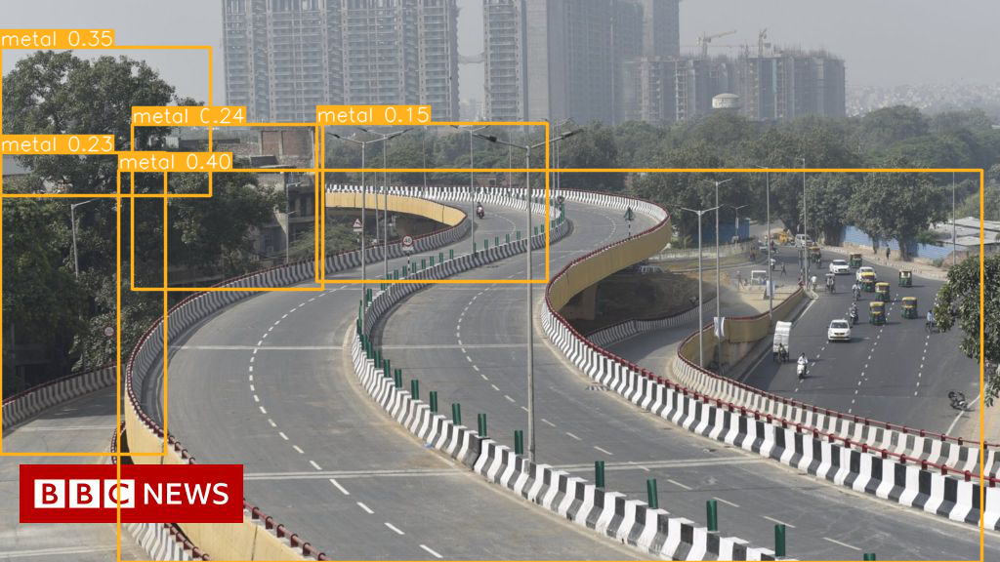

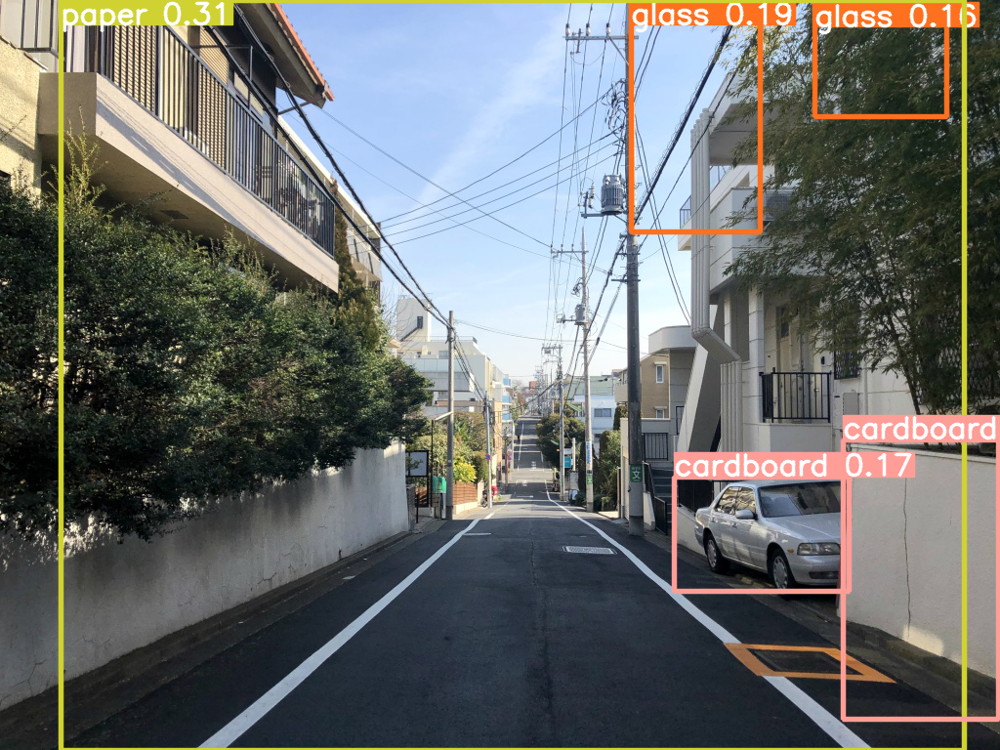

In [6]:
# Menampilkan 5 hasil gambar clean
clean_images = df[df['label'] == 0]['filepath'].sample(5)  # Memilih secara acak 5 gambar clean
for image_path in clean_images:
    results = model(image_path, size=640)
    predictions = results.pred[0]
    boxes = predictions[:, :4]
    scores = predictions[:, 4]
    categories = predictions[:, 5]
    results.show()